In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [2]:
books_df = pd.read_csv('Books.csv', encoding='latin1')

In [3]:
books_df

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...
...,...,...,...,...,...,...,...,...
271355,0440400988,There's a Bat in Bunk Five,Paula Danziger,1988,Random House Childrens Pub (Mm),http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...,http://images.amazon.com/images/P/0440400988.0...
271356,0525447644,From One to One Hundred,Teri Sloat,1991,Dutton Books,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...,http://images.amazon.com/images/P/0525447644.0...
271357,006008667X,Lily Dale : The True Story of the Town that Ta...,Christine Wicker,2004,HarperSanFrancisco,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...,http://images.amazon.com/images/P/006008667X.0...
271358,0192126040,Republic (World's Classics),Plato,1996,Oxford University Press,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...,http://images.amazon.com/images/P/0192126040.0...


In [4]:
books_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 271360 non-null  object
 1   Book-Title           271360 non-null  object
 2   Book-Author          271358 non-null  object
 3   Year-Of-Publication  271360 non-null  object
 4   Publisher            271358 non-null  object
 5   Image-URL-S          271360 non-null  object
 6   Image-URL-M          271360 non-null  object
 7   Image-URL-L          271357 non-null  object
dtypes: object(8)
memory usage: 16.6+ MB


In [5]:
books_df.isnull().sum()

ISBN                   0
Book-Title             0
Book-Author            2
Year-Of-Publication    0
Publisher              2
Image-URL-S            0
Image-URL-M            0
Image-URL-L            3
dtype: int64

In [6]:
# Dropping non-relevant columns directly in books_df
books_df.drop(['Image-URL-S','Image-URL-M','Image-URL-L'], axis=1, inplace=True)


In [7]:
# checking for unique values number in each column
for i in books_df.columns:
    print(i,books_df[i].nunique())

ISBN 271360
Book-Title 242135
Book-Author 102022
Year-Of-Publication 202
Publisher 16807


In [8]:
books_df['Year-Of-Publication'].unique()

array([2002, 2001, 1991, 1999, 2000, 1993, 1996, 1988, 2004, 1998, 1994,
       2003, 1997, 1983, 1979, 1995, 1982, 1985, 1992, 1986, 1978, 1980,
       1952, 1987, 1990, 1981, 1989, 1984, 0, 1968, 1961, 1958, 1974,
       1976, 1971, 1977, 1975, 1965, 1941, 1970, 1962, 1973, 1972, 1960,
       1966, 1920, 1956, 1959, 1953, 1951, 1942, 1963, 1964, 1969, 1954,
       1950, 1967, 2005, 1957, 1940, 1937, 1955, 1946, 1936, 1930, 2011,
       1925, 1948, 1943, 1947, 1945, 1923, 2020, 1939, 1926, 1938, 2030,
       1911, 1904, 1949, 1932, 1928, 1929, 1927, 1931, 1914, 2050, 1934,
       1910, 1933, 1902, 1924, 1921, 1900, 2038, 2026, 1944, 1917, 1901,
       2010, 1908, 1906, 1935, 1806, 2021, '2000', '1995', '1999', '2004',
       '2003', '1990', '1994', '1986', '1989', '2002', '1981', '1993',
       '1983', '1982', '1976', '1991', '1977', '1998', '1992', '1996',
       '0', '1997', '2001', '1974', '1968', '1987', '1984', '1988',
       '1963', '1956', '1970', '1985', '1978', '1973', '1980'

#### The 'Year-Of-Publication' column has some invalid values in it, which need to be taken care of

In [9]:
# Assuming 'books_df' is your DataFrame
# Step 1: Convert all values in the column to numeric
books_df['Year-Of-Publication'] = pd.to_numeric(books_df['Year-Of-Publication'], errors='coerce')

# Step 2: Calculate median or mean (depending on your preference)
median_year = books_df['Year-Of-Publication'].median()
# Or mean_year = books_df['Year-Of-Publication'].mean()

# Step 3: Fill zero values with median or mean
books_df['Year-Of-Publication'] = books_df['Year-Of-Publication'].replace(0, median_year)
# Or books_df['Year-Of-Publication'] = books_df['Year-Of-Publication'].replace(0, mean_year)

# Drop rows with non-integer values and NaN
books_df = books_df.dropna(subset=['Year-Of-Publication'])

# Convert 'Year-Of-Publication' column to integers
books_df['Year-Of-Publication'] = books_df['Year-Of-Publication'].astype(int)

# Display unique values after cleaning
print(books_df['Year-Of-Publication'].unique())


[2002 2001 1991 1999 2000 1993 1996 1988 2004 1998 1994 2003 1997 1983
 1979 1995 1982 1985 1992 1986 1978 1980 1952 1987 1990 1981 1989 1984
 1968 1961 1958 1974 1976 1971 1977 1975 1965 1941 1970 1962 1973 1972
 1960 1966 1920 1956 1959 1953 1951 1942 1963 1964 1969 1954 1950 1967
 2005 1957 1940 1937 1955 1946 1936 1930 2011 1925 1948 1943 1947 1945
 1923 2020 1939 1926 1938 2030 1911 1904 1949 1932 1928 1929 1927 1931
 1914 2050 1934 1910 1933 1902 1924 1921 1900 2038 2026 1944 1917 1901
 2010 1908 1906 1935 1806 2021 2012 2006 1909 2008 1378 1919 1922 1897
 2024 1376 2037]


In [10]:
# Grouping the DataFrame by 'Book-Author' column to get to know each author's books
author_groups = books_df.groupby('Book-Author')

# Iterating through each group
for author, group in author_groups:
    if len(group) > 1:  # Only consider authors with more than one book
        print(f"Books by '{author}':")
        for index, row in group.iterrows():
            print(f"- {row['Book-Title']} ({row['Year-Of-Publication']})")
        print()

Books by 'A &amp; E Television Network':
- Amelia Earhart: Queen of the Air (Biography Audiobooks) (1998)
- John F. Kennedy: A Personal Story (Biography Audiobooks) (1998)

Books by 'A A Milne':
- Piglet Meets a Heffalump (1995)
- Christopher Robin Gives Pooh a Party (1995)
- Kanga and Baby Roo Come to the Forest (1995)
- Pooh Goes Visiting and Pooh and Piglet Nearl (1995)
- Winnie the Pooh Storybook Treasury (1995)

Books by 'A B Guthrie':
- These Thousand Hills (1995)
- Big Sky (1995)

Books by 'A E Hartink':
- Encyclopedia of Pistols and Revolvers (1995)
- Encyclopedia of Rifles and Carbines (1995)

Books by 'A E Van Vogt':
- Best of a E Van Vogt Volume 2 (1995)
- Supermind (1995)

Books by 'A Martin':
- Navajazos (1995)
- Martillazos (1995)
- La Camisa Del Reves (1995)

Books by 'A Rich':
- Rich: of Woman Born (10th Anniversary Edition) (Paper) (1986)
- Rich: Blood Bread and Poetry - Selected Prose 1979-1985 (1986)

Books by 'A S Byatt':
- Sugar and Other Stories (1995)
- Virgin In

In [11]:
# Grouping the DataFrame by 'Book-Author' column and counting the number of books in each group
author_book_counts = books_df.groupby('Book-Author').size()

# Printing the number of books published by each author
for author, count in author_book_counts.items():
    print(f"{author}: {count} books")



 D. Chiel: 1 books
 J. D. Landis: 1 books
 Mimma Balia: 1 books
'N Sync: 1 books
142 moms from all over the world: 1 books
1977 Inaugural Committee (U.S.): 1 books
1st Graders of Samuel s Nixon School Carnegie Penn: 1 books
21st Century Publishing: 1 books
73 Magazine Editors: 1 books
;Katie Stewart": 1 books
A &amp; C Black Ltd.: 1 books
A &amp; E Television Network: 2 books
A A Milne: 5 books
A Adams: 1 books
A Alvarez: 1 books
A B Guthrie: 2 books
A B Simpson: 1 books
A Blue Mountain Arts Collection: 1 books
A Bodenburg Sommer: 1 books
A Dumas: 1 books
A E Hartink: 2 books
A E Van Vogt: 2 books
A Finlayson: 1 books
A First Book: 1 books
A Frank: 1 books
A Franquin: 1 books
A G Eyre: 1 books
A Ganeri: 1 books
A H Kramer-Lampher: 1 books
A Hunter: 1 books
A Kollontai: 1 books
A Lobo Antunes: 1 books
A Martin: 3 books
A McKeane: 1 books
A Monk of the Eastern Church: 1 books
A MunnÃ©-JordÃ : 1 books
A N Jeffares: 1 books
A Norman Jeffares: 1 books
A Paton: 1 books
A Perry: 1 books
A R L

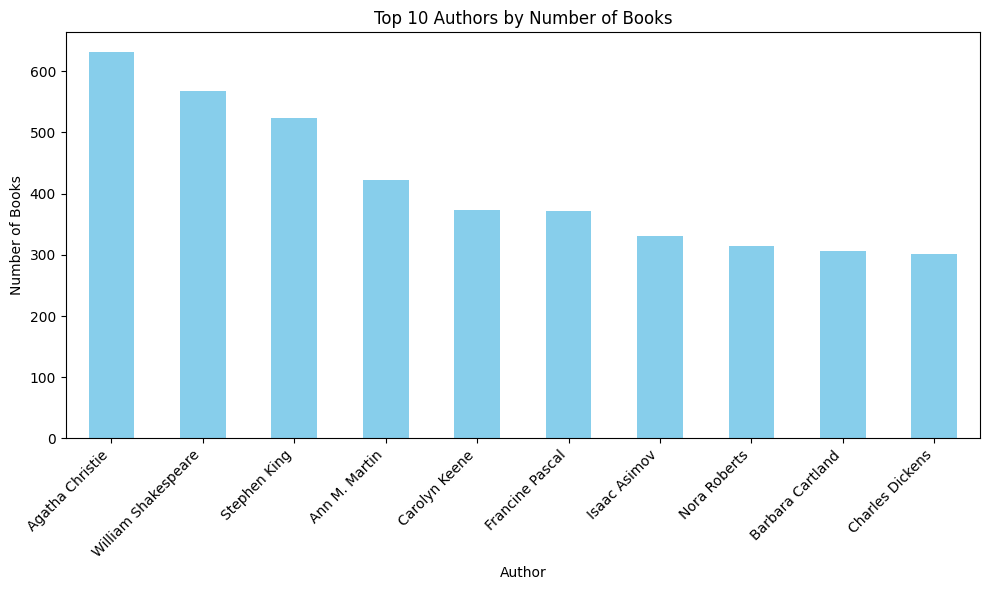

In [12]:
# Assuming 'author_book_counts' contains the grouped data
top_authors = author_book_counts.nlargest(10)

# Plotting the top 10 authors
plt.figure(figsize=(10, 6))
top_authors.plot(kind='bar', color='skyblue')
plt.title('Top 10 Authors by Number of Books')
plt.xlabel('Author')
plt.ylabel('Number of Books')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


In [13]:
books_df

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company
...,...,...,...,...,...
271355,0440400988,There's a Bat in Bunk Five,Paula Danziger,1988,Random House Childrens Pub (Mm)
271356,0525447644,From One to One Hundred,Teri Sloat,1991,Dutton Books
271357,006008667X,Lily Dale : The True Story of the Town that Ta...,Christine Wicker,2004,HarperSanFrancisco
271358,0192126040,Republic (World's Classics),Plato,1996,Oxford University Press


In [14]:
ratings_df = pd.read_csv('Ratings.csv')
ratings_df

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6
...,...,...,...
1149775,276704,1563526298,9
1149776,276706,0679447156,0
1149777,276709,0515107662,10
1149778,276721,0590442449,10


In [15]:
ratings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149780 entries, 0 to 1149779
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   User-ID      1149780 non-null  int64 
 1   ISBN         1149780 non-null  object
 2   Book-Rating  1149780 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 26.3+ MB


In [16]:
ratings_df.describe()

,User-ID,Book-Rating
count,1.149780e+06,1.149780e+06
mean,1.403864e+05,2.866950e+00
std,8.056228e+04,3.854184e+00
min,2.000000e+00,0.000000e+00
25%,7.034500e+04,0.000000e+00
50%,1.410100e+05,0.000000e+00
75%,2.110280e+05,7.000000e+00
max,2.788540e+05,1.000000e+01


In [17]:
# checking for unique values number in each column
for i in ratings_df.columns:
    print(i,ratings_df[i].nunique())

User-ID 105283
ISBN 340556
Book-Rating 11


In [18]:
ratings_df.isnull().sum()

User-ID        0
ISBN           0
Book-Rating    0
dtype: int64

In [30]:
users_df = pd.read_csv('Users.csv',encoding='latin1')
users_df

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN
...,...,...,...
278853,278854,"portland, oregon, usa",NaN
278854,278855,"tacoma, washington, united kingdom",50.0
278855,278856,"brampton, ontario, canada",NaN
278856,278857,"knoxville, tennessee, usa",NaN


In [31]:
users_df.isnull().sum()

User-ID          0
Location         0
Age         110762
dtype: int64

In [32]:
users_df.describe()

,User-ID,Age
count,278858.00000,168096.000000
mean,139429.50000,34.751434
std,80499.51502,14.428097
min,1.00000,0.000000
25%,69715.25000,24.000000
50%,139429.50000,32.000000
75%,209143.75000,44.000000
max,278858.00000,244.000000


In [33]:
print(books_df.columns)
print(ratings_df.columns)
print(users_df.columns)

Index(['ISBN', 'Book-Title', 'Book-Author', 'Year-Of-Publication',
       'Publisher'],
      dtype='object')
Index(['User-ID', 'ISBN', 'Book-Rating'], dtype='object')
Index(['User-ID', 'Location', 'Age'], dtype='object')


In [34]:
# Merge the books_df and ratings_df DataFrames on the 'ISBN' column
merged_df = pd.merge(books_df, ratings_df, on='ISBN', how='inner')

In [35]:
merged_df

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,User-ID,Book-Rating
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,2,0
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,8,5
2,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,11400,0
3,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,11676,8
4,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,41385,0
...,...,...,...,...,...,...,...
1031127,0440400988,There's a Bat in Bunk Five,Paula Danziger,1988,Random House Childrens Pub (Mm),276463,7
1031128,0525447644,From One to One Hundred,Teri Sloat,1991,Dutton Books,276579,4
1031129,006008667X,Lily Dale : The True Story of the Town that Ta...,Christine Wicker,2004,HarperSanFrancisco,276680,0
1031130,0192126040,Republic (World's Classics),Plato,1996,Oxford University Press,276680,0


In [36]:
merged_df['ISBN'].nunique()

270148

In [37]:
merged_df.isnull().sum()

ISBN                   0
Book-Title             0
Book-Author            2
Year-Of-Publication    0
Publisher              2
User-ID                0
Book-Rating            0
dtype: int64

In [38]:
users_df

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN
...,...,...,...
278853,278854,"portland, oregon, usa",NaN
278854,278855,"tacoma, washington, united kingdom",50.0
278855,278856,"brampton, ontario, canada",NaN
278856,278857,"knoxville, tennessee, usa",NaN


In [39]:
final_merged_df = pd.merge(merged_df, users_df, on='User-ID', how='inner')

In [40]:
final_merged_df

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,User-ID,Book-Rating,Location,Age
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,2,0,"stockton, california, usa",18.0
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,8,5,"timmins, ontario, canada",NaN
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,8,0,"timmins, ontario, canada",NaN
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,8,0,"timmins, ontario, canada",NaN
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,8,0,"timmins, ontario, canada",NaN
...,...,...,...,...,...,...,...,...,...
1031127,087004124X,Anthem,Ayn Rand,1966,Caxton Press,259589,8,"venice, florida, usa",19.0
1031128,158243123X,A Student of Weather,Elizabeth Hay,2001,Counterpoint Press,259591,8,"tioga, pennsylvania, usa",39.0
1031129,8485900057,Rimas y leyendas (ClÃ¡sicos Fraile ; 3),Gustavo Adolfo BÃ©cquer,1981,Ediciones Fraile,259614,10,"madrid, madrid, spain",22.0
1031130,0838934854,Anglo-American Cataloguing Rules,Michael Gorman,1998,American Library Association,259679,6,"grand prairie, texas, usa",27.0


In [41]:
final_merged_df.isnull().sum()

ISBN                        0
Book-Title                  0
Book-Author                 2
Year-Of-Publication         0
Publisher                   2
User-ID                     0
Book-Rating                 0
Location                    0
Age                    277833
dtype: int64

In [43]:
# considering to drop age column as it has a large amount of null values
df1 = final_merged_df.drop('Age',axis=1)

In [44]:
df1

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,User-ID,Book-Rating,Location
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,2,0,"stockton, california, usa"
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,8,5,"timmins, ontario, canada"
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,8,0,"timmins, ontario, canada"
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,8,0,"timmins, ontario, canada"
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,8,0,"timmins, ontario, canada"
...,...,...,...,...,...,...,...,...
1031127,087004124X,Anthem,Ayn Rand,1966,Caxton Press,259589,8,"venice, florida, usa"
1031128,158243123X,A Student of Weather,Elizabeth Hay,2001,Counterpoint Press,259591,8,"tioga, pennsylvania, usa"
1031129,8485900057,Rimas y leyendas (ClÃ¡sicos Fraile ; 3),Gustavo Adolfo BÃ©cquer,1981,Ediciones Fraile,259614,10,"madrid, madrid, spain"
1031130,0838934854,Anglo-American Cataloguing Rules,Michael Gorman,1998,American Library Association,259679,6,"grand prairie, texas, usa"


In [45]:
df1.dropna(inplace=True)

In [46]:
df1

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,User-ID,Book-Rating,Location
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,2,0,"stockton, california, usa"
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,8,5,"timmins, ontario, canada"
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,8,0,"timmins, ontario, canada"
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,8,0,"timmins, ontario, canada"
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,8,0,"timmins, ontario, canada"
...,...,...,...,...,...,...,...,...
1031127,087004124X,Anthem,Ayn Rand,1966,Caxton Press,259589,8,"venice, florida, usa"
1031128,158243123X,A Student of Weather,Elizabeth Hay,2001,Counterpoint Press,259591,8,"tioga, pennsylvania, usa"
1031129,8485900057,Rimas y leyendas (ClÃ¡sicos Fraile ; 3),Gustavo Adolfo BÃ©cquer,1981,Ediciones Fraile,259614,10,"madrid, madrid, spain"
1031130,0838934854,Anglo-American Cataloguing Rules,Michael Gorman,1998,American Library Association,259679,6,"grand prairie, texas, usa"


In [47]:
df1.isnull().sum()

ISBN                   0
Book-Title             0
Book-Author            0
Year-Of-Publication    0
Publisher              0
User-ID                0
Book-Rating            0
Location               0
dtype: int64

In [55]:
df1.dtypes

ISBN                   object
Book-Title             object
Book-Author            object
Year-Of-Publication     int32
Publisher              object
User-ID                 int64
Book-Rating             int64
Location               object
dtype: object

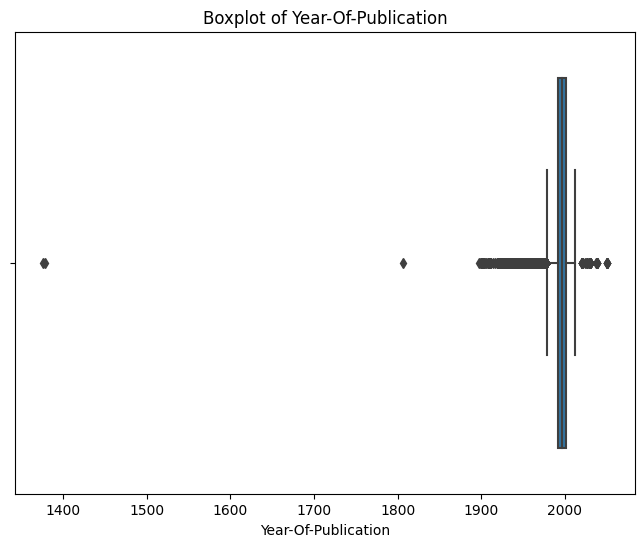

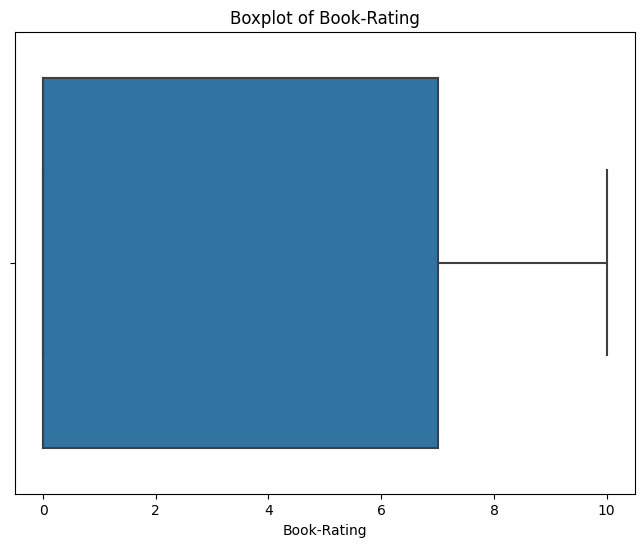

In [57]:
# Boxplot for Year-Of-Publication
plt.figure(figsize=(8, 6))
sns.boxplot(x='Year-Of-Publication', data=df1)
plt.title('Boxplot of Year-Of-Publication')
plt.show()

# Boxplot for Book-Rating
plt.figure(figsize=(8, 6))
sns.boxplot(x='Book-Rating', data=df1)
plt.title('Boxplot of Book-Rating')
plt.show()


#### Very few outliers in 'Year-of-Publication' column and no outliers in 'Book-Rating'

In [48]:
df2 = final_merged_df

In [49]:
df2.isnull().sum()

ISBN                        0
Book-Title                  0
Book-Author                 2
Year-Of-Publication         0
Publisher                   2
User-ID                     0
Book-Rating                 0
Location                    0
Age                    277833
dtype: int64

In [50]:
# considering to fill the null values in Age column using its median value
df2['Age'].fillna(df2['Age'].median(),inplace=True)

In [51]:
df2.isnull().sum()

ISBN                   0
Book-Title             0
Book-Author            2
Year-Of-Publication    0
Publisher              2
User-ID                0
Book-Rating            0
Location               0
Age                    0
dtype: int64

In [53]:
df2.dropna(inplace=True)

In [54]:
df2.dtypes

ISBN                    object
Book-Title              object
Book-Author             object
Year-Of-Publication      int32
Publisher               object
User-ID                  int64
Book-Rating              int64
Location                object
Age                    float64
dtype: object

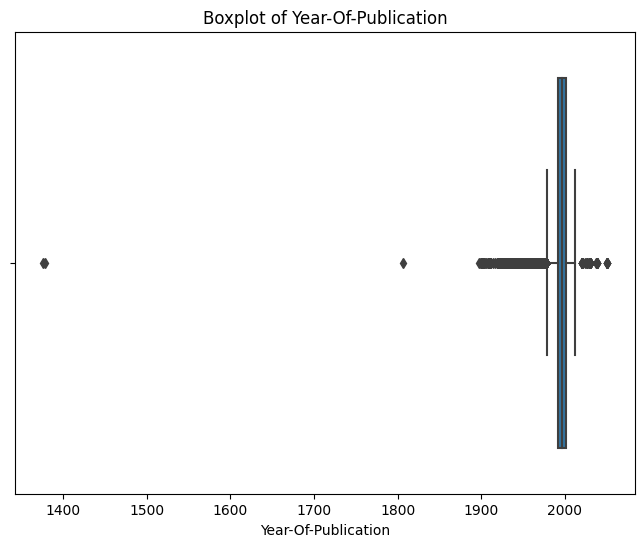

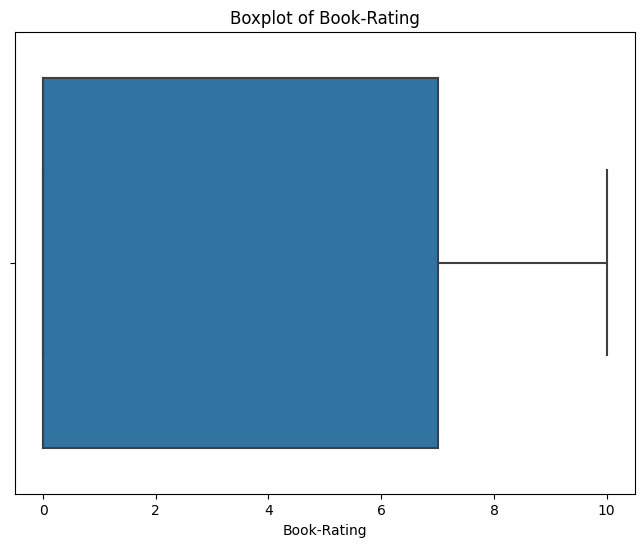

In [59]:
# Boxplot for Year-Of-Publication
plt.figure(figsize=(8, 6))
sns.boxplot(x='Year-Of-Publication', data=df2)
plt.title('Boxplot of Year-Of-Publication')
plt.show()

# Boxplot for Book-Rating
plt.figure(figsize=(8, 6))
sns.boxplot(x='Book-Rating', data=df2)
plt.title('Boxplot of Book-Rating')
plt.show()

In [62]:
# take df1 if Age feature is not needed
# take df2 if Age feature is considered